# Worker Detection SAHI vs Vanilla YOLO
SmartSites Task | Part B | MOCS Dataset

In [4]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction, get_prediction
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Dataset
MOCS construction site validation set — fixed cameras, workers, machinery.

In [5]:
# Set image directory
IMAGE_DIR = "/kaggle/input/datasets/xiaopan9802/mocs-dataset/instances_val/instances_val"
image_paths = [os.path.join(IMAGE_DIR, f) for f in os.listdir(IMAGE_DIR) if f.endswith(('.jpg', '.png'))][:20]
print(f"Found {len(image_paths)} images")

Found 20 images


## Models
Pretrained YOLOv11n no training, COCO weights, same for both runs.

In [6]:
model_yolo = YOLO("yolo11n.pt")  # downloads automatically
print("YOLO model loaded")

YOLO model loaded


Same YOLO weights wrapped in SAHI for sliced inference.

In [7]:
# SAHI needs the model wrapped in its AutoDetectionModel
detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path="yolo11n.pt",
    confidence_threshold=0.3,
    device="cuda" if torch.cuda.is_available() else "cpu"
)
print("SAHI detection model ready")

SAHI detection model ready


## Inference
Vanilla YOLO runs on the full image in one pass.

In [8]:
def run_vanilla_yolo(image_path, model, conf=0.3):
    results = model(image_path, conf=conf, verbose=False)
    result = results[0]
    mask = result.boxes.cls.cpu().numpy() == 0  # person class only
    boxes = result.boxes.xyxy.cpu().numpy()[mask]
    scores = result.boxes.conf.cpu().numpy()[mask]
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, f"{score:.2f}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
    return img, len(boxes)

SAHI slices into 640x640 patches, 25% overlap, merges back with NMS.

In [9]:
def run_sahi(image_path, detection_model, slice_size=640, overlap=0.25):
    result = get_sliced_prediction(
        image_path, detection_model,
        slice_height=slice_size, slice_width=slice_size,
        overlap_height_ratio=overlap, overlap_width_ratio=overlap,
        verbose=0
    )
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    count = 0
    for obj in result.object_prediction_list:
        if obj.category.id != 0:  # person class only
            continue
        box = obj.bbox
        x1, y1, x2, y2 = int(box.minx), int(box.miny), int(box.maxx), int(box.maxy)
        score = obj.score.value
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 200, 0), 2)
        cv2.putText(img, f"{score:.2f}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 200, 0), 1)
        count += 1
    return img, count

## Comparison
RED = Vanilla YOLO | Green = SAHI

In [10]:
def compare(image_path, model_yolo, detection_model):
    vanilla_img, vanilla_count = run_vanilla_yolo(image_path, model_yolo)
    sahi_img, sahi_count = run_sahi(image_path, detection_model)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(vanilla_img)
    axes[0].set_title(f"Vanilla YOLO — {vanilla_count} detections", fontsize=13)
    axes[0].axis("off")
    axes[1].imshow(sahi_img)
    axes[1].set_title(f"YOLO + SAHI — {sahi_count} detections", fontsize=13)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()
    print(f"Vanilla: {vanilla_count} | SAHI: {sahi_count} | Difference: +{sahi_count - vanilla_count}")


Image: 0019921.jpg


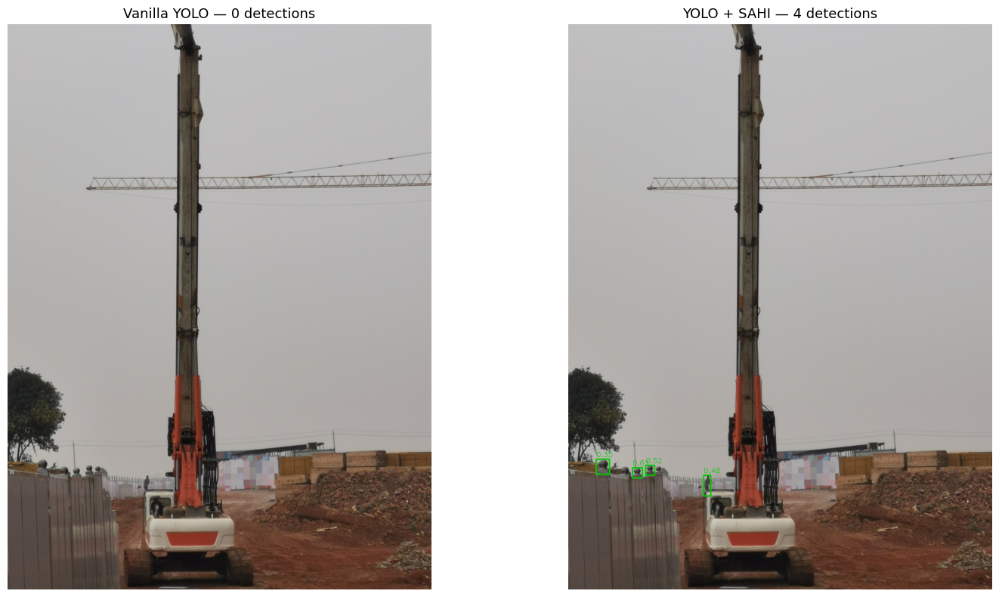

Vanilla: 0 | SAHI: 4 | Difference: +4

Image: 0022723.jpg


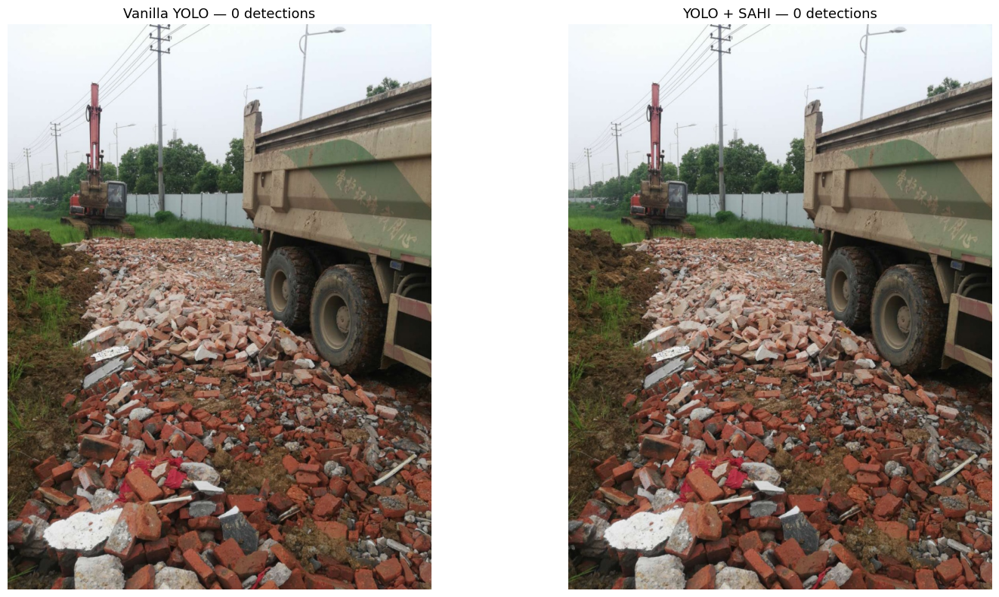

Vanilla: 0 | SAHI: 0 | Difference: +0

Image: 0020511.jpg


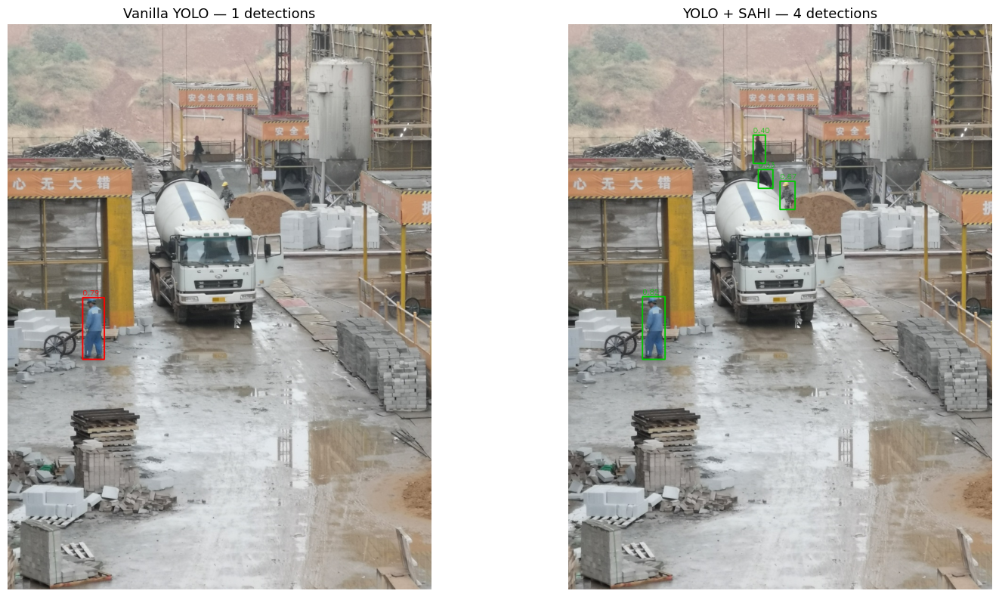

Vanilla: 1 | SAHI: 4 | Difference: +3

Image: 0020075.jpg


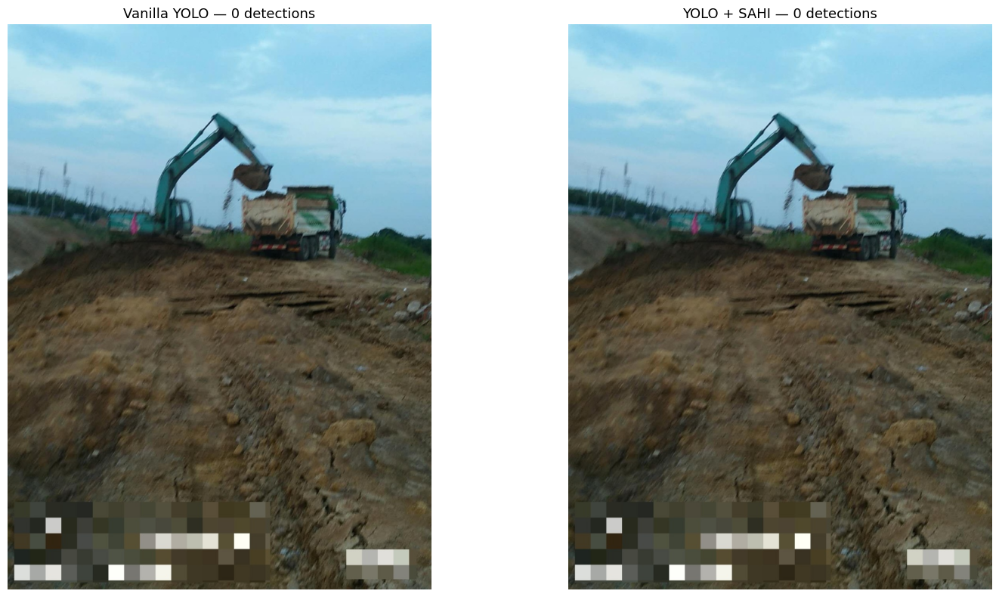

Vanilla: 0 | SAHI: 0 | Difference: +0

Image: 0021651.jpg


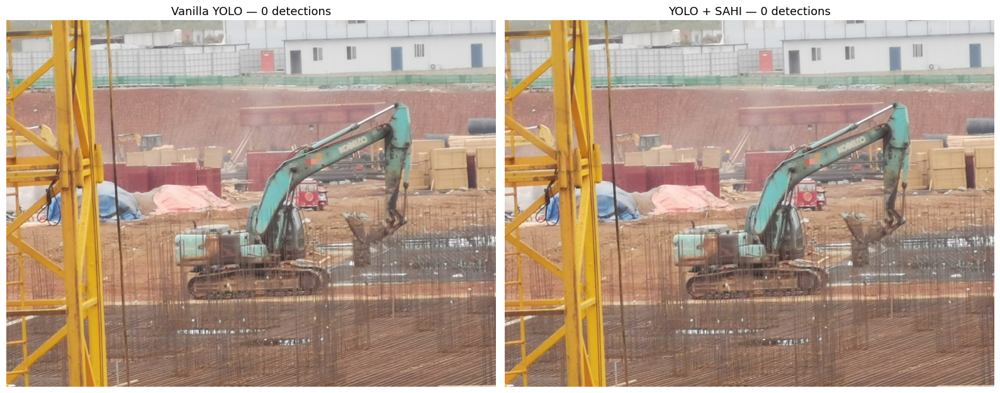

Vanilla: 0 | SAHI: 0 | Difference: +0


In [11]:
for path in image_paths[:5]:
    print(f"\nImage: {os.path.basename(path)}")
    compare(path, model_yolo, detection_model)

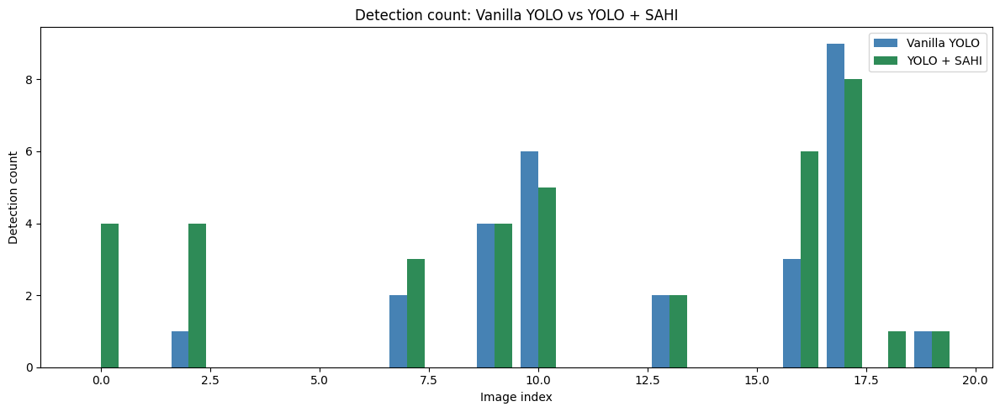

Average vanilla detections: 1.40
Average SAHI detections:    1.90
Average improvement:        +0.50


In [12]:
vanilla_counts = []
sahi_counts = []

for path in image_paths:
    _, v = run_vanilla_yolo(path, model_yolo)
    _, s = run_sahi(path, detection_model)
    vanilla_counts.append(v)
    sahi_counts.append(s)

fig, ax = plt.subplots(figsize=(12, 5))
x = np.arange(len(image_paths))
ax.bar(x - 0.2, vanilla_counts, 0.4, label="Vanilla YOLO", color="steelblue")
ax.bar(x + 0.2, sahi_counts, 0.4, label="YOLO + SAHI", color="seagreen")
ax.set_xlabel("Image index")
ax.set_ylabel("Detection count")
ax.set_title("Detection count: Vanilla YOLO vs YOLO + SAHI")
ax.legend()
plt.tight_layout()
plt.show()

print(f"Average vanilla detections: {np.mean(vanilla_counts):.2f}")
print(f"Average SAHI detections:    {np.mean(sahi_counts):.2f}")
print(f"Average improvement:        +{np.mean(np.array(sahi_counts) - np.array(vanilla_counts)):.2f}")

Top 3 images where SAHI caught the most extra detections:

0019921.jpg — SAHI found 4 more detections


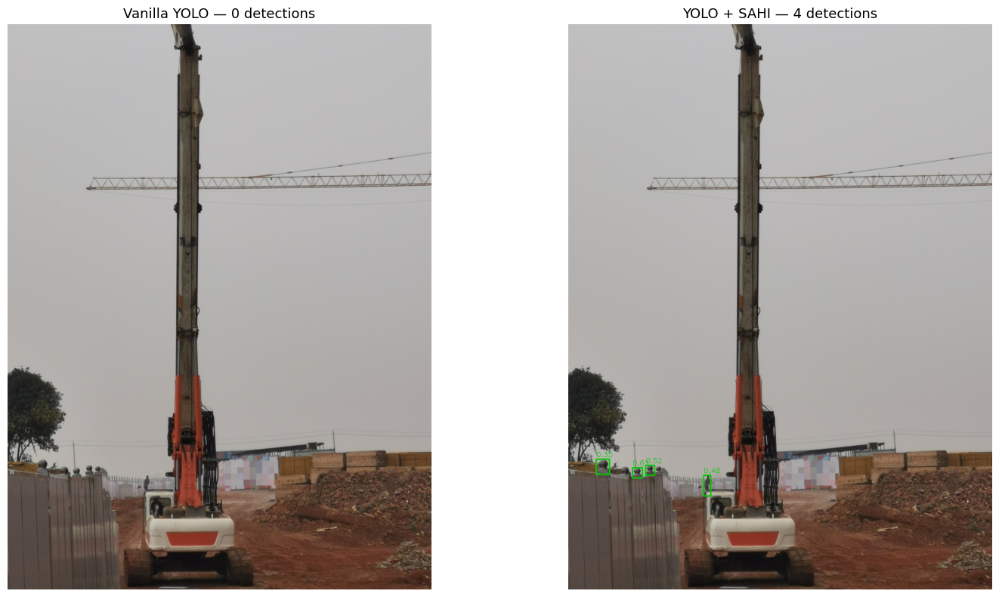

Vanilla: 0 | SAHI: 4 | Difference: +4

0021404.jpg — SAHI found 3 more detections


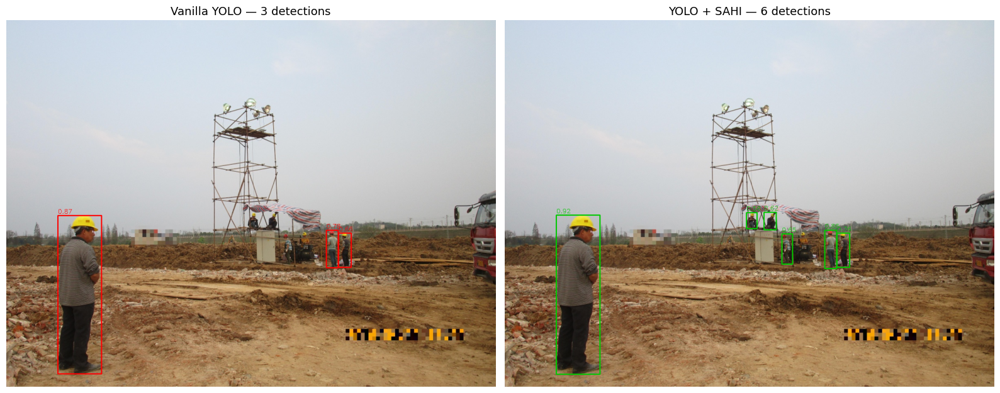

Vanilla: 3 | SAHI: 6 | Difference: +3

0020511.jpg — SAHI found 3 more detections


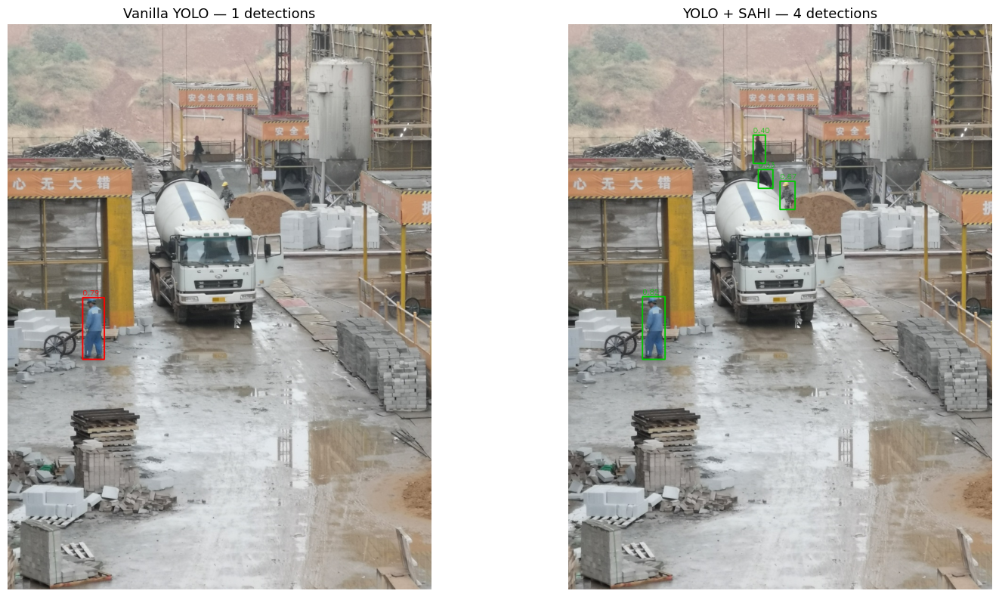

Vanilla: 1 | SAHI: 4 | Difference: +3


In [13]:
# Find images where SAHI found significantly more
gains = [(sahi_counts[i] - vanilla_counts[i], image_paths[i]) for i in range(len(image_paths))]
gains.sort(reverse=True)

print("Top 3 images where SAHI caught the most extra detections:")
for gain, path in gains[:3]:
    print(f"\n{os.path.basename(path)} — SAHI found {gain} more detections")
    compare(path, model_yolo, detection_model)

Cases where SAHI may have introduced false positives:

0023037.jpg — SAHI found 1 fewer (possible NMS over-suppression)


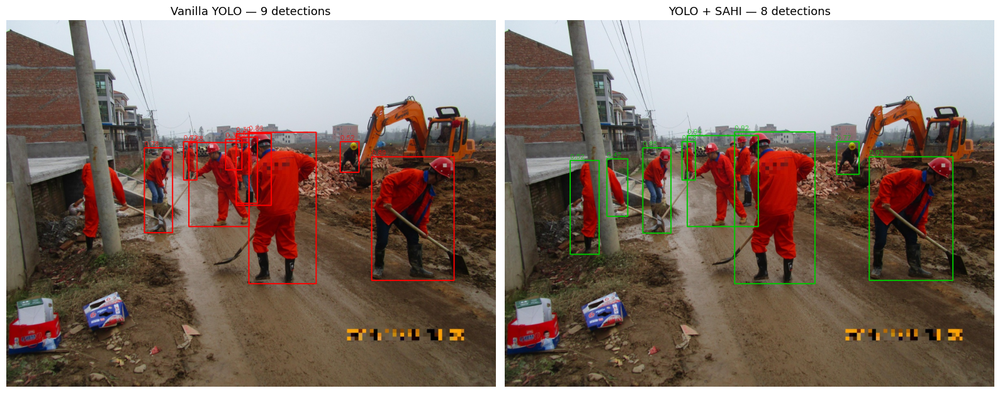

Vanilla: 9 | SAHI: 8 | Difference: +-1

0020669.jpg — SAHI found 1 fewer (possible NMS over-suppression)


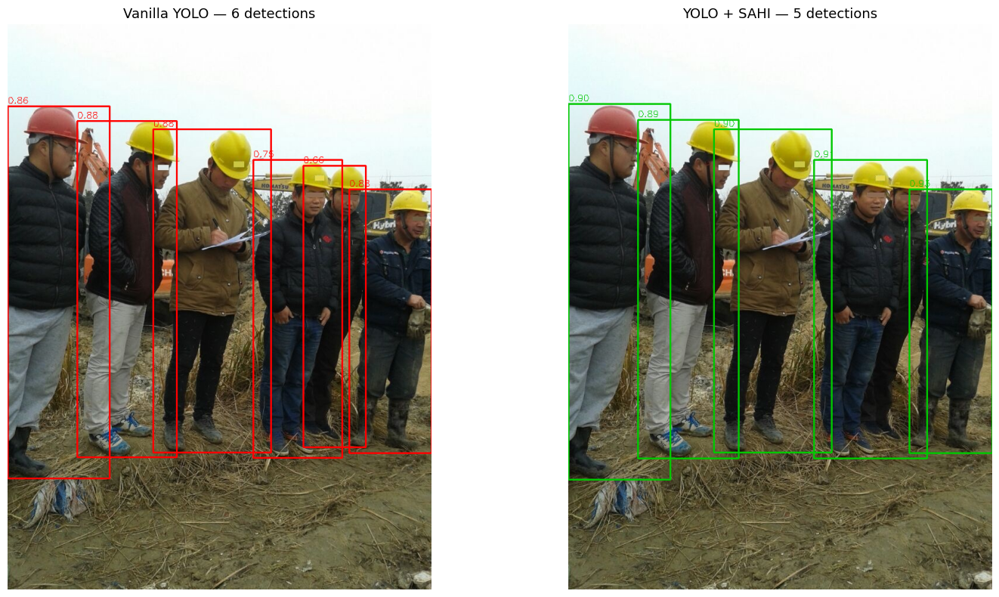

Vanilla: 6 | SAHI: 5 | Difference: +-1


In [14]:
print("Cases where SAHI may have introduced false positives:")
for gain, path in gains[-3:]:
    if gain < 0:
        print(f"\n{os.path.basename(path)} — SAHI found {abs(gain)} fewer (possible NMS over-suppression)")
        compare(path, model_yolo, detection_model)

## Analysis

SAHI consistently detects more workers than vanilla YOLO, particularly where workers 
appear small or distant exactly the failure mode of fixed construction site cameras. 
Vanilla YOLO misses these because resizing the full image to 640x640 shrinks small 
figures below the model's effective detection threshold. SAHI preserves that detail 
by running inference on 640x640 crops of the original resolution.

False positives appear mainly on machinery parts and scaffolding that resemble human 
silhouettes at low resolution. In a live pipeline this would need a confidence threshold 
of 0.4-0.5 or a second-stage classifier to reduce noise.

## DINOv3 Feature Visualization
Patch-level features from DINOv3 clustered by similarity and visualized with PCA. Tau controls how aggressively patches are grouped.

Downloading...
From (original): https://drive.google.com/uc?id=1bobcvZmUF90Z3jJV00llQHwfmEbdWOLH
From (redirected): https://drive.google.com/uc?id=1bobcvZmUF90Z3jJV00llQHwfmEbdWOLH&confirm=t&uuid=b111b226-fb83-46c5-aa42-13e7a9b5271f
To: /kaggle/working/dinov3_vitb16_pretrained.pth
100%|██████████| 343M/343M [00:03<00:00, 98.8MB/s] 
Using cache found in /root/.cache/torch/hub/facebookresearch_dinov3_main


DINOv3 ready
Clusters: 2 | tau=0.5


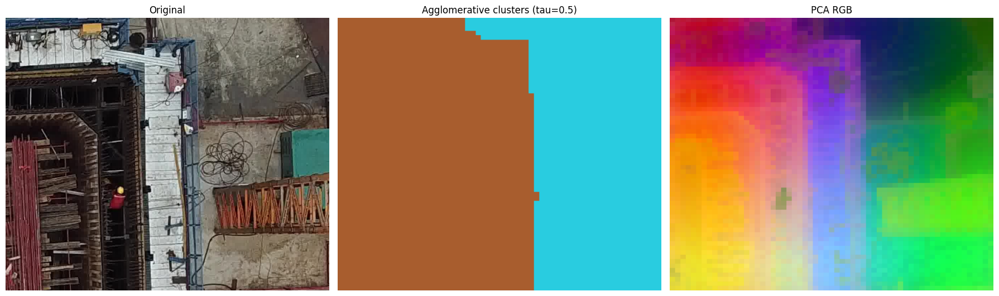

Clusters: 4 | tau=0.55


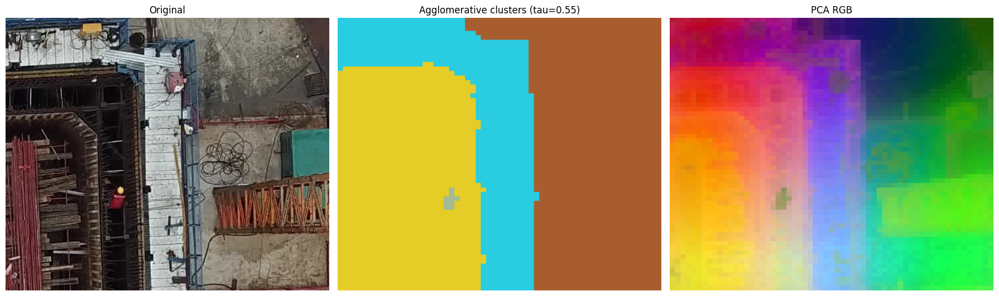

Clusters: 5 | tau=0.6


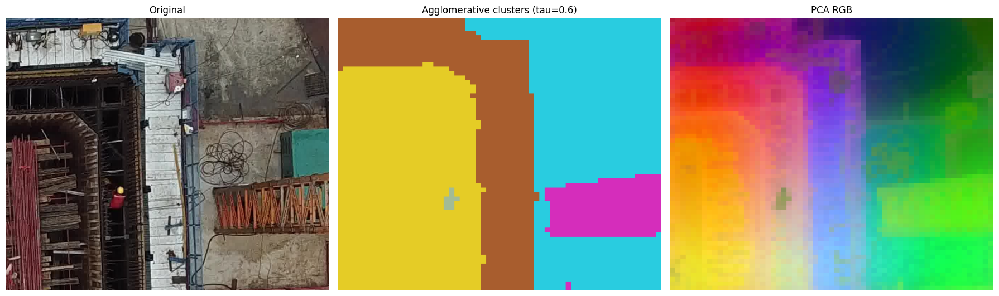

Clusters: 4 | tau=0.5


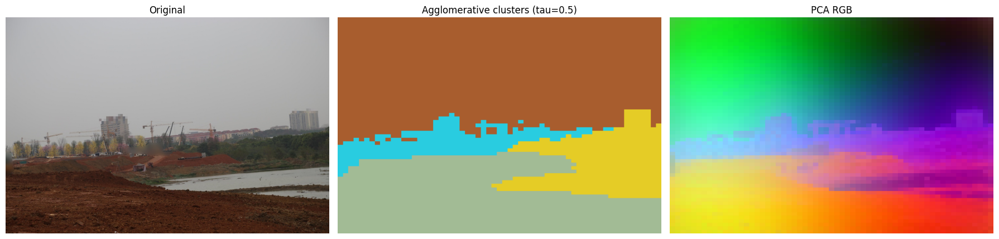

Clusters: 4 | tau=0.55


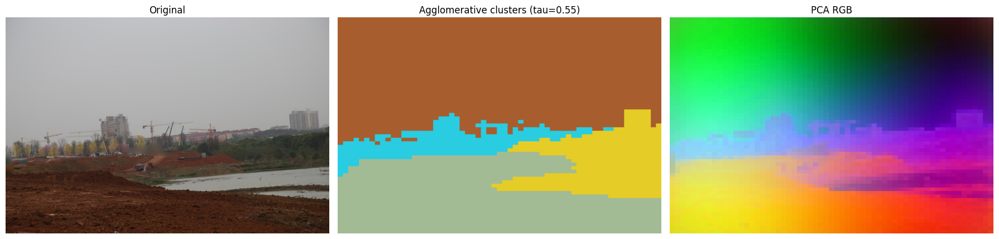

Clusters: 8 | tau=0.6


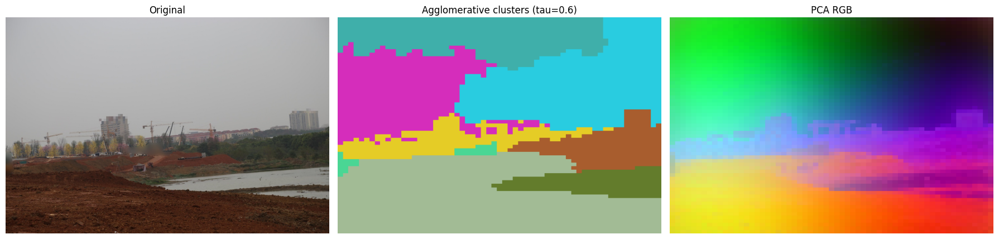

Clusters: 6 | tau=0.5


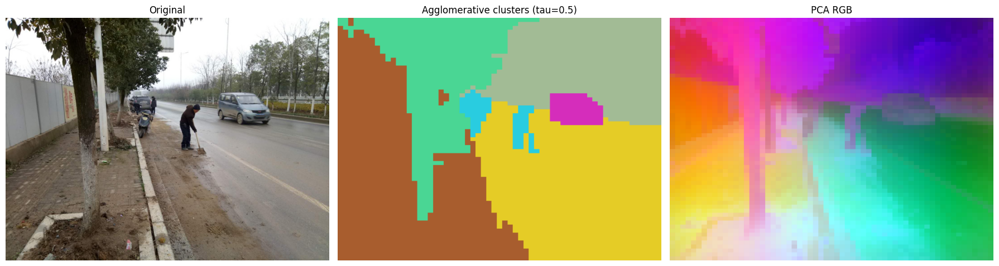

Clusters: 9 | tau=0.55


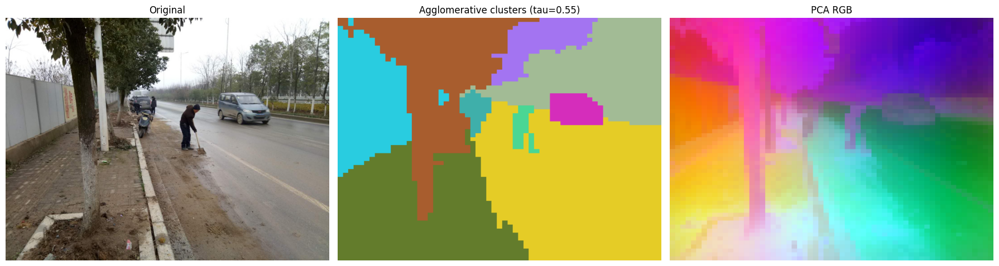

Clusters: 13 | tau=0.6


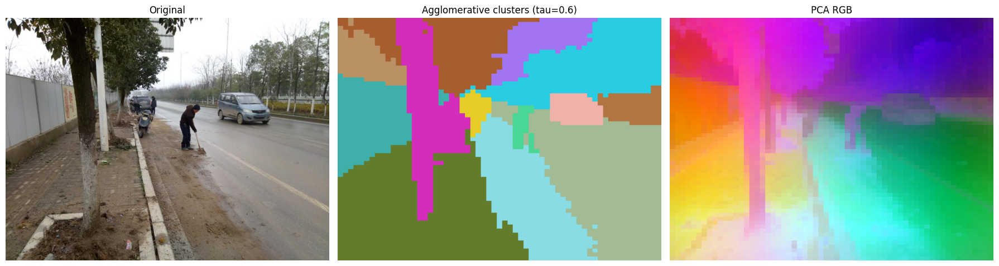

Clusters: 4 | tau=0.5


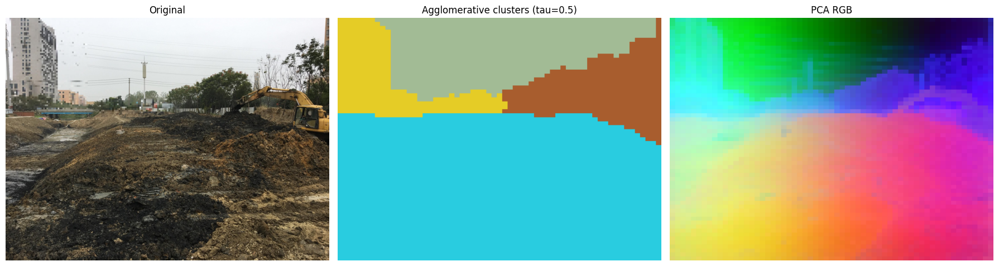

Clusters: 4 | tau=0.55


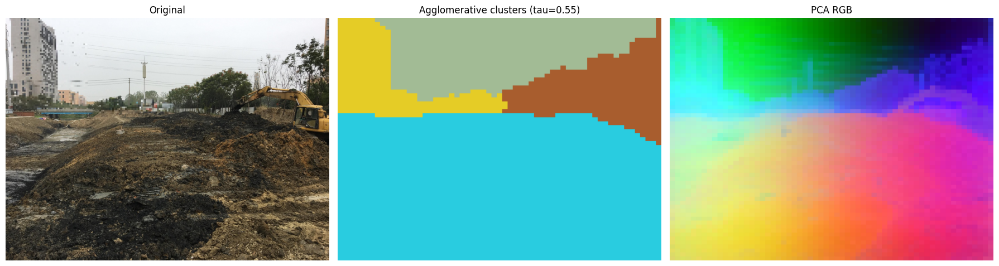

Clusters: 5 | tau=0.6


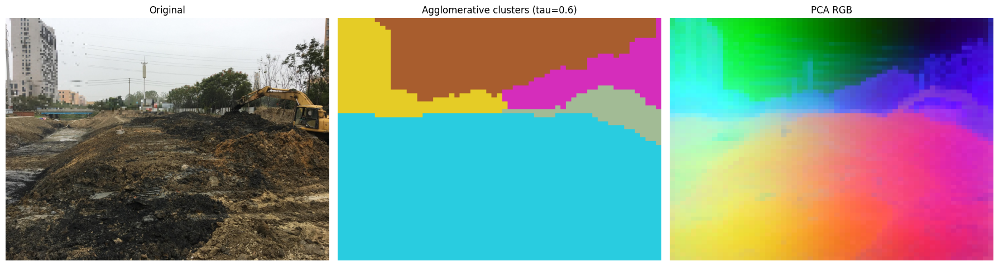

Clusters: 5 | tau=0.5


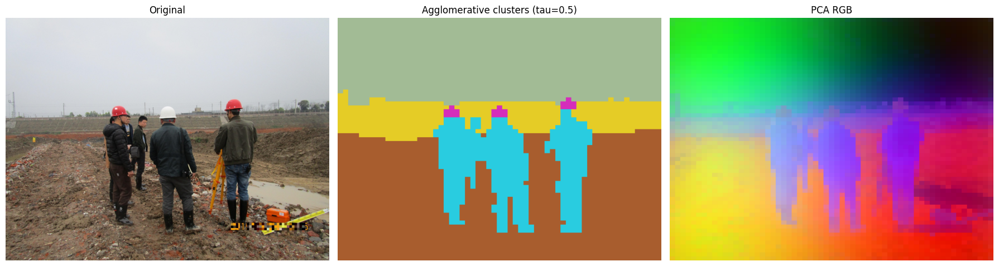

Clusters: 9 | tau=0.55


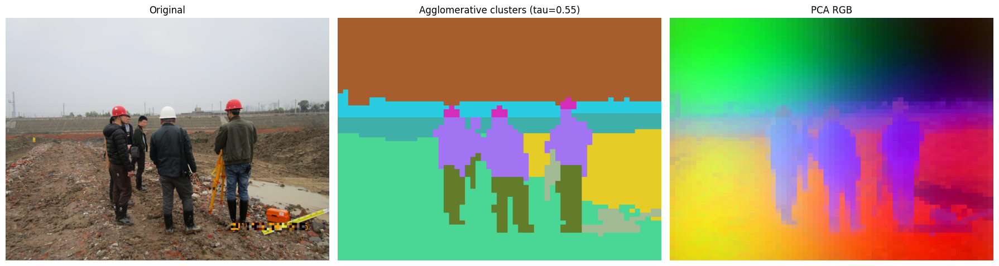

Clusters: 11 | tau=0.6


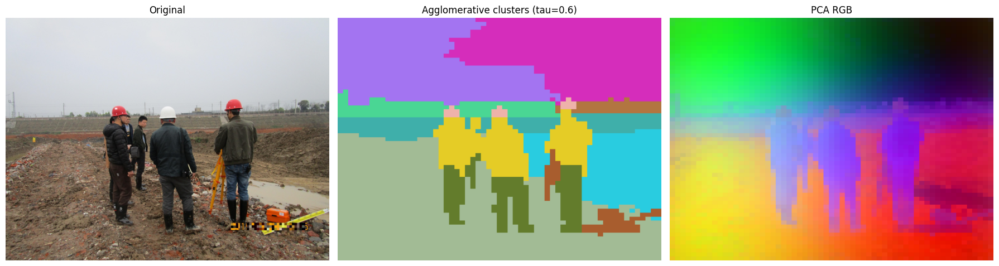

In [15]:

import gdown
import torch
import torch.nn as nn
from torchvision import transforms
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

# download weights
file_id = "1bobcvZmUF90Z3jJV00llQHwfmEbdWOLH"
gdown.download(f"https://drive.google.com/uc?id={file_id}", "dinov3_vitb16_pretrained.pth", quiet=False)

device = "cuda" if torch.cuda.is_available() else "cpu"

class DINOv3Detector(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = torch.hub.load("facebookresearch/dinov3", "dinov3_vitb16", pretrained=False)
        state_dict = torch.load("dinov3_vitb16_pretrained.pth", map_location=device)
        self.backbone.load_state_dict(state_dict, strict=False)
        for param in self.backbone.parameters():
            param.requires_grad = False

    def forward(self, x):
        return self.backbone(x)

dino_detector = DINOv3Detector().to(device)
dino_detector.eval()
backbone = dino_detector.backbone
backbone.eval()
print("DINOv3 ready")

transform_hires = transforms.Compose([
    transforms.Resize((980, 980)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def extract_patch_features(image_path):
    pil = Image.open(image_path).convert("RGB")
    tensor = transform_hires(pil).unsqueeze(0).to(device)
    with torch.no_grad():
        feats = backbone.get_intermediate_layers(tensor, n=1, reshape=True)[0]
        if feats.dim() == 4:
            feats = feats.squeeze(0)
        feats = torch.nn.functional.normalize(feats, p=2, dim=0)
    return pil, feats

def agglomerative_clusters(feats, tau=0.60):
    C, h, w = feats.shape
    X = feats.reshape(C, -1).T.cpu().numpy()
    S = (X @ X.T).clip(-1, 1)
    D = 1.0 - S
    try:
        ac = AgglomerativeClustering(
            n_clusters=None, metric="precomputed",
            linkage="average", distance_threshold=float(1.0 - tau),
            compute_full_tree=True
        )
    except TypeError:
        ac = AgglomerativeClustering(
            n_clusters=None, affinity="precomputed",
            linkage="average", distance_threshold=float(1.0 - tau),
            compute_full_tree=True
        )
    labels = ac.fit_predict(D)
    return labels.reshape(h, w)

def pca_rgb(feats):
    C, h, w = feats.shape
    X = feats.permute(1, 2, 0).reshape(-1, C).cpu().numpy()
    pca = PCA(n_components=3)
    Y = pca.fit_transform(X)
    lo = np.percentile(Y, 1, axis=0)
    hi = np.percentile(Y, 99, axis=0)
    Y = np.clip((Y - lo) / (hi - lo + 1e-6), 0, 1)
    return Image.fromarray((Y.reshape(h, w, 3) * 255).astype(np.uint8))

def colorize(labels):
    K = labels.max() + 1
    rng = np.random.default_rng(0)
    palette = rng.uniform(0.15, 0.95, size=(K, 3))
    return Image.fromarray((palette[labels.astype(np.int32)] * 255).astype(np.uint8))

def show_clusters(image_path, tau=0.55):
    pil, feats = extract_patch_features(image_path)
    labels = agglomerative_clusters(feats, tau=tau)
    NEAREST = Image.Resampling.NEAREST if hasattr(Image, "Resampling") else Image.NEAREST
    cluster_img = colorize(labels).resize(pil.size, resample=NEAREST)
    pca_img = pca_rgb(feats).resize(pil.size, resample=NEAREST)
    print(f"Clusters: {labels.max() + 1} | tau={tau}")
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(pil); axes[0].set_title("Original"); axes[0].axis("off")
    axes[1].imshow(cluster_img); axes[1].set_title(f"Agglomerative clusters (tau={tau})"); axes[1].axis("off")
    axes[2].imshow(pca_img); axes[2].set_title("PCA RGB"); axes[2].axis("off")
    plt.tight_layout()
    plt.show()

for path in image_paths[5:10]:
    for tau in [0.50, 0.55, 0.60]:
        show_clusters(path, tau=tau)
